<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2024/blob/main/SEBB4083_Mini_Project_Group_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2024 (Groceries Classification)
### Total marks: 30

### Group No.: 9

###Group Members:
1) SUNE PEI FENG （A20EB0076)

2) NUR FARISHA HANNA BINTI HAMIZUN (A20EB0052)

3) CLANESSA TERRA PETER (A20EB0013)

4) NURUL ATIRAH BINTI MAPPAUYWI (A20EB0063)

5) SYAKIRAH ATHIRAH BINTI ABDULLA HAMID (A20EB0078)


## Chapter 1: Introduction



1.1 Background of study and related works

Machine learning and deep learning algorithms are traditionally designed to operate within a specific feature-space distribution. When this distribution shifts, the models must be redeveloped from the ground up, which is a challenging process that includes collecting the necessary training data (Tammina, 2019). Moreover, deep learning models require a substantial amount of labeled data for training. Transfer learning can greatly enhance learning performance by leveraging labeled data or knowledge from related domains. The core concept of transfer learning is to use information from these related areas to help a machine learning algorithm perform better in the target domain. Transfer learning utilizes pre-trained models that have been trained on previous tasks and applies them to new, related tasks (Tammina, 2019).

The related work from this project is development of an automated algorithm to classify two classes of groceries based on images by using Convolutional Neural Network (CNN) transfer learning. This project involves creating a local dataset by capturing images of groceries in different modes, developing a CNN-based classifier using Python.

###1.2 Objectives

Objectives of the tasks:

1. Dataset Creation: Capture and compile images of two grocery classes from local supermarkets, ensuring variation in camera angles and distances.

2. Algorithm Development: Implement a CNN classifier using transfer learning to distinguish between the two grocery classes.

## Chapter 2: Methodology and Results

# **a) no augmentation, unfreeze last layer**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

In [ ]:
#dowload file from google drive
! gdown 1QYEgb650N8hdWDLPh_RS06LMZDsmAsC4

#unzip dowloaded file
with ZipFile('/content/G9.zip', 'r') as zipObj:
  zipObj.extractall()

Downloading...
From (original): https://drive.google.com/uc?id=1QYEgb650N8hdWDLPh_RS06LMZDsmAsC4
From (redirected): https://drive.google.com/uc?id=1QYEgb650N8hdWDLPh_RS06LMZDsmAsC4&confirm=t&uuid=440c1c46-15c4-4495-913b-2760e97b81e6
To: /content/G9.zip
100% 1.78G/1.78G [00:32<00:00, 54.9MB/s]


In [ ]:
#set parameter for imagedatagenerator
batch_size = 50 #since we use mini-batch gradient descent
img_height = 224
img_width = 224

In [ ]:
#Split data into 70% training data and 30% testing data
# Define the path to your dataset directory
dataset_dir = '/content/G9'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/output'

# Define the percentage of data to be used for testing
test_split = 0.3

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Candy', 'Chip']
/content/G9/Candy/photo_1_2024-06-08_01-09-37.jpg
/content/output/train/Candy/photo_1_2024-06-08_01-09-37.jpg
/content/G9/Candy/FruitplusStrawberryFar3.HEIC
/content/output/train/Candy/FruitplusStrawberryFar3.HEIC
/content/G9/Candy/HaribomixFar4.HEIC
/content/output/train/Candy/HaribomixFar4.HEIC
/content/G9/Candy/IMG20240527194924.jpg
/content/output/train/Candy/IMG20240527194924.jpg
/content/G9/Candy/photo_92_2024-06-07_07-27-26.jpg
/content/output/train/Candy/photo_92_2024-06-07_07-27-26.jpg
/content/G9/Candy/photo_91_2024-06-07_07-27-26.jpg
/content/output/train/Candy/photo_91_2024-06-07_07-27-26.jpg
/content/G9/Candy/SaltLemonFar2.HEIC
/content/output/train/Candy/SaltLemonFar2.HEIC
/content/G9/Candy/IMG_20240531_205556.jpg
/content/output/train/Candy/IMG_20240531_205556.jpg
/content/G9/Candy/IMG20240527200810.jpg
/content/output/train/Candy/IMG20240527200810.jpg
/content/G9/Candy/HaribomixFar1.HEIC
/content/output/train/Candy/HaribomixFar1.HEIC
/content/G9/Candy/

In [ ]:
# Define the path to the subfolder containing the images
test_Candy_path = '/content/output/test/Candy'
test_Chip_path = '/content/output/test/Chip'
train_Candy_path = '/content/output/train/Candy'
train_Chip_path = '/content/output/train/Chip'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_Candy_path) if os.path.isfile(os.path.join(test_Candy_path, name))])
num_images2 = len([name for name in os.listdir(test_Chip_path) if os.path.isfile(os.path.join(test_Chip_path, name))])
num_images3 = len([name for name in os.listdir(train_Candy_path) if os.path.isfile(os.path.join(train_Candy_path, name))])
num_images4 = len([name for name in os.listdir(train_Chip_path) if os.path.isfile(os.path.join(train_Chip_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Candy: {num_images1}")
print(f"Number of images in the test/Chip: {num_images2}")
print(f"Number of images in the train/Candy: {num_images3}")
print(f"Number of images in the train/Chip: {num_images4}")

Number of images in the test/Candy: 149
Number of images in the test/Chip: 150
Number of images in the train/Candy: 346
Number of images in the train/Chip: 347


In [ ]:
# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Candy" , "Chip"] #make sure the spelling is similar to the folder name


# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 432 images belonging to 2 classes.
Found 107 images belonging to 2 classes.
Found 242 images belonging to 2 classes.


(50, 224, 224, 3)
(50,)


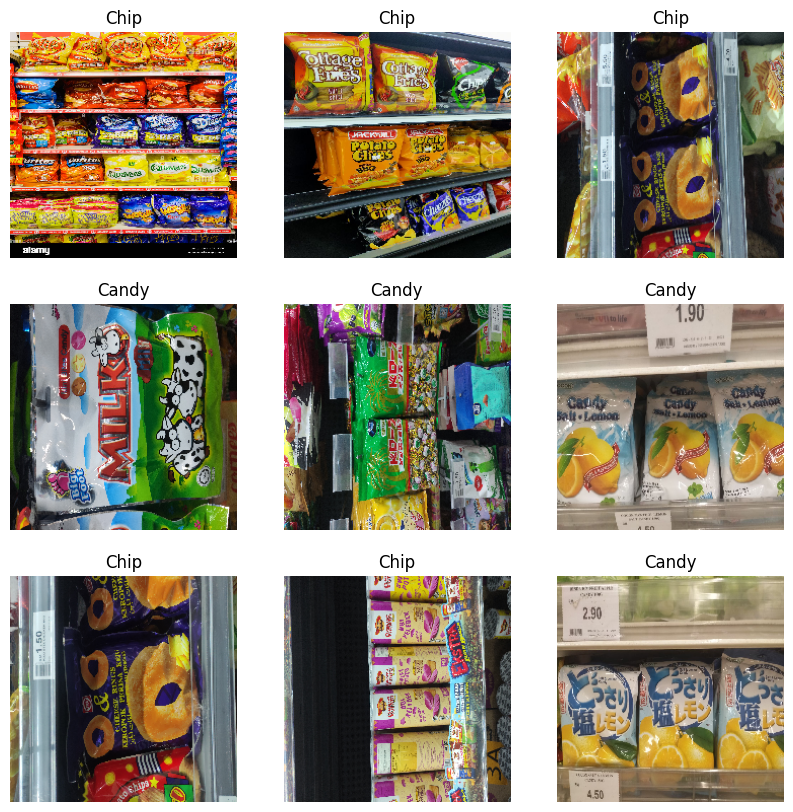

In [ ]:
#visualization of the data
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

553467096/553467096 [==============================] - 4s 0us/step
****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                 

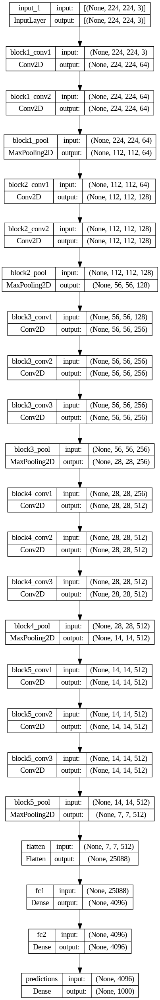

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

In [ ]:
#Freezing the existing weights/layers
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer #unfreeze last layer only
model.add(tf.keras.layers.Dense(2))

#example if your want to unfreeze 2 last layers
#for layer in model.layers[-2:]:
    #layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [ ]:
#compile model
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

#train model
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
9/9 [==============================] - 42s 3s/step - loss: 1.1610 - accuracy: 0.5926 - val_loss: 0.8179 - val_accuracy: 0.7383
Epoch 2/3
9/9 [==============================] - 29s 3s/step - loss: 0.4758 - accuracy: 0.7963 - val_loss: 0.7822 - val_accuracy: 0.6916
Epoch 3/3
9/9 [==============================] - 27s 3s/step - loss: 0.2853 - accuracy: 0.8727 - val_loss: 0.8661 - val_accuracy: 0.6916


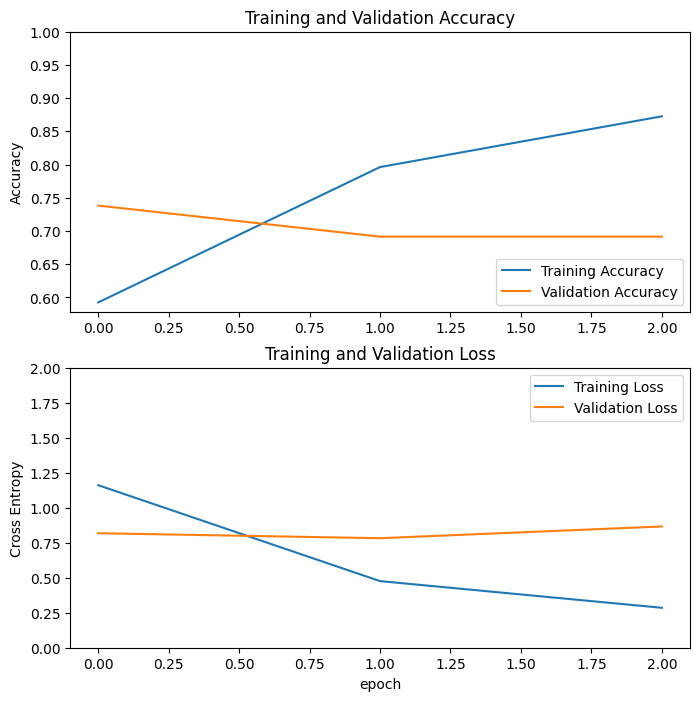

In [ ]:
#plot curves
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,2.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


5/5 [==============================] - 20s 4s/step - loss: 0.3093 - accuracy: 0.8554
Test accuracy: 0.85537189245224


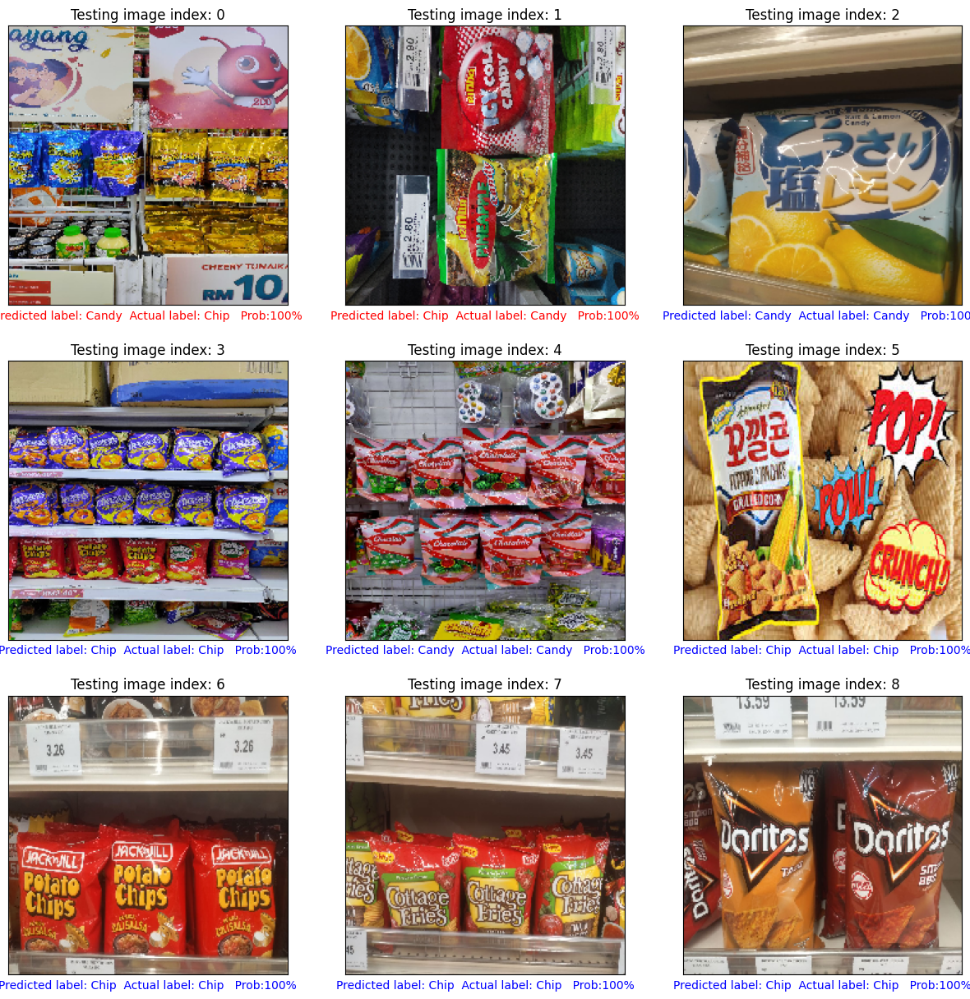

In [ ]:
#test model
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

In [ ]:
# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 432 images belonging to 2 classes.


(50, 224, 224, 3)
(50,)


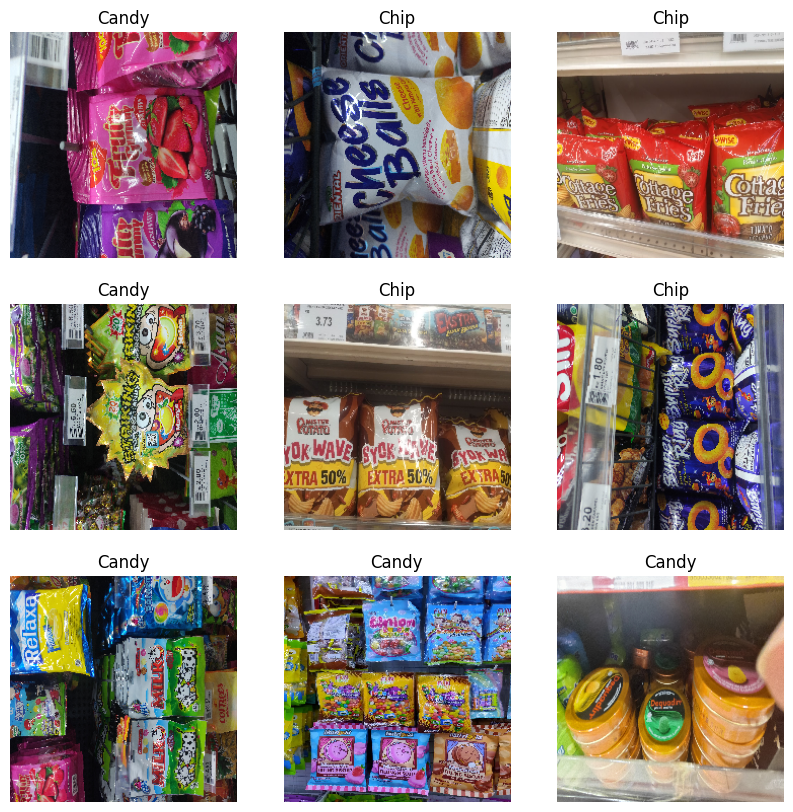

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

Explain step by step together with code and results............

## **b) augmentation, freeze last layer**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


#resize to jpg
!pip install pillow
!pip install pyheif
import os
from PIL import Image
import pyheif

def convert_heic_to_image(heic_path):
    heif_file = pyheif.read(heic_path)
    image = Image.frombytes(
        heif_file.mode,
        heif_file.size,
        heif_file.data,
        "raw",
        heif_file.mode,
        heif_file.stride,
    )
    return image

def resize_images(source_dir, destination_dir, size=(224, 224)):
    # Create the destination directory if it doesn't exist
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    # Iterate over each file in the source directory
    for filename in os.listdir(source_dir):
        # Construct full file path
        file_path = os.path.join(source_dir, filename)

        # Check if it is a file
        if os.path.isfile(file_path):
            try:
                # Open an image file
                if filename.lower().endswith('.heic'):
                    img = convert_heic_to_image(file_path)
                else:
                    img = Image.open(file_path)

                # Resize image
                img_resized = img.resize(size)

                # Create a new filename with .jpg extension
                base_filename = os.path.splitext(filename)[0]
                destination_path = os.path.join(destination_dir, f"{base_filename}.jpg")

                # Save the resized image to the destination directory in JPEG format
                img_resized.save(destination_path, "JPEG")

                print(f'Resized and saved {filename} as {destination_path}')
            except Exception as e:
                print(f'Failed to process {filename}: {e}')

# Example usage
source_directory = '/content/drive/MyDrive/G9/raw/Candy/'
destination_directory = '/content/drive/MyDrive/G9/raw/Candy/'
resize_images(source_directory, destination_directory)

In [ ]:
#augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image, UnidentifiedImageError

# Define the batch size and image dimensions
batch_size = 32
img_height, img_width = 224, 224

# List of class names
names = ["Chip", "Candy"]

# Define the path to your dataset directory
dataset_dir = '/content/drive/MyDrive/G9/raw/'

# Define the path to the output directory
output_dir = '/content/drive/MyDrive/G9/aug/'

# Define the target number of images per class after augmentation
target_images_per_class = 2000

# Function to validate images
def validate_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify that it is, in fact, an image
        return True
    except (IOError, UnidentifiedImageError):
        return False

# Function to count the number of images in each class
def count_images_per_class(output_class_dir):
    if os.path.exists(output_class_dir):
        return len([f for f in os.listdir(output_class_dir) if f.lower().endswith(('png', 'jpg', 'jpeg')) and validate_image(os.path.join(output_class_dir, f))])
    else:
        return 0

# Function to perform data augmentation and save augmented images to the output directory
def augment_images():
    # Create output directory for augmented images
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Define augmentation parameters
    datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
        channel_shift_range=50.0,
        vertical_flip=True,
        fill_mode='nearest'
    )

    while True:
        # Track whether all classes have reached their target number of images
        all_classes_completed = True

        for class_name in names:
            # Create output directory for the current class
            class_output_dir = os.path.join(output_dir, class_name)
            if not os.path.exists(class_output_dir):
                os.makedirs(class_output_dir)

            # Data generator for the current class with augmentation
            class_datagen = datagen.flow_from_directory(
                dataset_dir,
                target_size=(img_width, img_height),
                class_mode='sparse',
                batch_size=batch_size,
                shuffle=True,
                color_mode="rgb",
                classes=[class_name],
                save_to_dir=class_output_dir,
                save_prefix='aug',
                save_format='jpg'
            )

            # Count the number of images in the current class
            num_images = count_images_per_class(class_output_dir)

            if num_images < target_images_per_class:
                all_classes_completed = False
                try:
                    # Debug information
                    print(f"Generating images for class '{class_name}'")
                    class_datagen.next()
                except UnidentifiedImageError as e:
                    print(f"Error identifying image: {e}")
                except FileNotFoundError as e:
                    print(f"FileNotFoundError: {e}")
                    # Ensure directory exists before continuing
                    if not os.path.exists(class_output_dir):
                        os.makedirs(class_output_dir)
                    print(f"Created missing directory: {class_output_dir}")

        # Break the loop if all classes have reached the target number of images
        if all_classes_completed:
            break

# Perform data augmentation and save augmented images to the output directory
augment_images()

print("Data augmentation completed. Augmented images saved to 'aug' folder.")


In [ ]:
# Define the path to the subfolder containing the images
aug_Chip_path = '/content/drive/MyDrive/G9/aug/Chip/'
aug_Candy_path = '/content/drive/MyDrive/G9/aug/Candy/'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(aug_Chip_path) if os.path.isfile(os.path.join(aug_Chip_path, name))])
num_images2 = len([name for name in os.listdir(aug_Candy_path) if os.path.isfile(os.path.join(aug_Candy_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the aug/Chip: {num_images1}")
print(f"Number of images in the aug/Candy: {num_images2}")

Number of images in the aug/Chip: 2016
Number of images in the aug/Candy: 2016


Augmented images from aug/Chip:


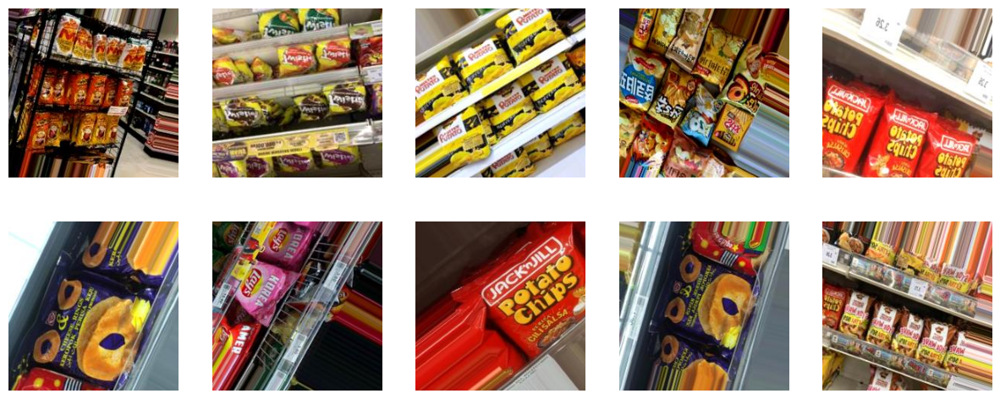

Augmented images from aug/Candy:


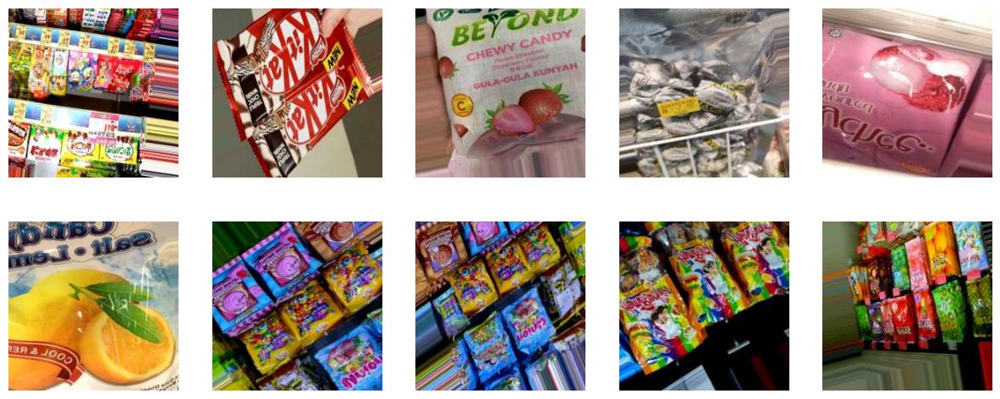

In [ ]:
import random
# Function to visualize augmented images in a 2x5 grid
def visualize_augmentation(folder_path, num_images_to_show=10):
    image_files = [os.path.join(folder_path, name) for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))]
    sampled_files = random.sample(image_files, min(num_images_to_show, len(image_files)))

    plt.figure(figsize=(15, 6))
    for i, image_file in enumerate(sampled_files):
        img = Image.open(image_file)
        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

# Visualize 10 random samples from each class
print("Augmented images from aug/Chip:")
visualize_augmentation(aug_Chip_path)

print("Augmented images from aug/Candy:")
visualize_augmentation(aug_Candy_path)

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the path to your dataset directory
dataset_dir = '/content/drive/MyDrive/G9/aug/'

# Define the path to the directory where you want to create the train, validation, and test folders
output_dir = '/content/drive/MyDrive/G9/output/'

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train, validation, and test folder paths
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'validation')
test_dir = os.path.join(output_dir, 'test')

# Delete train, validation, and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(val_dir):
    shutil.rmtree(val_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train, validation, and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(val_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train, validation, and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)

    # Split the data into train (70%) and test (30%)
    train_images, test_images = train_test_split(images, test_size=0.3, random_state=42)

    # Further split the train set into actual train (80%) and validation (20%)
    train_images, val_images = train_test_split(train_images, test_size=0.2, random_state=42)

    # Create the subfolders inside train, validation, and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    val_subfolder_dir = os.path.join(val_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(val_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_subfolder_dir, image)
        print(f'Copying {src} to {dst}')
        shutil.copyfile(src, dst)

    # Move the validation images to the validation folder
    for image in val_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(val_subfolder_dir, image)
        print(f'Copying {src} to {dst}')
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_subfolder_dir, image)
        print(f'Copying {src} to {dst}')
        shutil.copyfile(src, dst)


['Chip', 'Candy']
Copying /content/drive/MyDrive/G9/aug/Chip/aug_367_3081033.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_367_3081033.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_393_9321254.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_393_9321254.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_486_7915460.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_486_7915460.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_215_9731711.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_215_9731711.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_381_685332.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_381_685332.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_248_8465582.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_248_8465582.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_481_9344493.jpg to /content/drive/MyDrive/G9/output/train/Chip/aug_481_9344493.jpg
Copying /content/drive/MyDrive/G9/aug/Chip/aug_39_4557542.jpg to /content/

In [ ]:
# Define the path to the subfolder containing the images
train_Chip_path = '/content/drive/MyDrive/G9/output/train/Chip/'
train_Candy_path = '/content/drive/MyDrive/G9/output/train/Candy/'
test_Chip_path = '/content/drive/MyDrive/G9/output/test/Chip/'
test_Candy_path = '/content/drive/MyDrive/G9/output/test/Candy/'
validation_Chip_path = '/content/drive/MyDrive/G9/output/validation/Chip/'
validation_Candy_path = '/content/drive/MyDrive/G9/output/validation/Candy/'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(train_Chip_path) if os.path.isfile(os.path.join(train_Chip_path, name))])
num_images2 = len([name for name in os.listdir(train_Candy_path) if os.path.isfile(os.path.join(train_Candy_path, name))])
num_images3 = len([name for name in os.listdir(test_Chip_path) if os.path.isfile(os.path.join(test_Chip_path, name))])
num_images4 = len([name for name in os.listdir(test_Candy_path) if os.path.isfile(os.path.join(test_Candy_path, name))])
num_images5 = len([name for name in os.listdir(validation_Chip_path) if os.path.isfile(os.path.join(validation_Chip_path, name))])
num_images6 = len([name for name in os.listdir(validation_Candy_path) if os.path.isfile(os.path.join(validation_Candy_path, name))])


# Print the number of images in the subfolder
print(f"Number of images in the train/Chip: {num_images1}")
print(f"Number of images in the train/Candy: {num_images2}")
print(f"Number of images in the test/Chip: {num_images3}")
print(f"Number of images in the test/Candy: {num_images4}")
print(f"Number of images in the validation/Chip: {num_images5}")
print(f"Number of images in the validation/Candy: {num_images6}")

Number of images in the train/Chip: 1128
Number of images in the train/Candy: 1128
Number of images in the test/Chip: 605
Number of images in the test/Candy: 605
Number of images in the validation/Chip: 283
Number of images in the validation/Candy: 283


In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

553467096/553467096 [==============================] - 5s 0us/step
****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                 

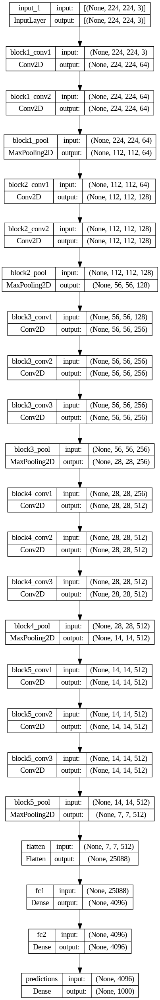

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam

# Define the optimizer
optimizer = Adam()

learning_rate = 0.001

# Compile the model with an optimizer and a loss function
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths to the directories
train_dir = '/content/drive/MyDrive/G9/output/train/'
test_dir = '/content/drive/MyDrive/G9/output/test/'
val_dir = '/content/drive/MyDrive/G9/output/validation/'

# ImageDataGenerator instances
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen =  ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Check if directories contain images
print(f"Number of training classes: {len(os.listdir(train_dir))}")
print(f"Number of test classes: {len(os.listdir(test_dir))}")
print(f"Number of validation classes: {len(os.listdir(val_dir))}")

# Ensure subfolders exist for each class
for subfolder in os.listdir(train_dir):
    subfolder_path = os.path.join(train_dir, subfolder)
    if os.path.isdir(subfolder_path):
        print(f"Training class '{subfolder}' contains {len(os.listdir(subfolder_path))} images.")

for subfolder in os.listdir(test_dir):
    subfolder_path = os.path.join(test_dir, subfolder)
    if os.path.isdir(subfolder_path):
        print(f"Test class '{subfolder}' contains {len(os.listdir(subfolder_path))} images.")

for subfolder in os.listdir(val_dir):
    subfolder_path = os.path.join(val_dir, subfolder)
    if os.path.isdir(subfolder_path):
        print(f"Validation class '{subfolder}' contains {len(os.listdir(subfolder_path))} images.")

# Parameters
img_width, img_height = 224, 224  # Example dimensions
batch_size = 20
names = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

# Data Generators
train_batches = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    class_mode='sparse',  # make label as integer value
    batch_size=batch_size,
    shuffle=True,
    color_mode="rgb",
    classes=names
)

test_batches = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    class_mode='sparse',  # make label as integer value
    batch_size=batch_size,
    shuffle=True,
    color_mode="rgb",
    classes=names
)

validation_batches = val_datagen.flow_from_directory(
    val_dir,
    target_size=(img_width, img_height),
    class_mode='sparse',  # make label as integer value
    batch_size=batch_size,
    shuffle=True,
    color_mode="rgb",
    classes=names
)


Number of training classes: 2
Number of test classes: 2
Number of validation classes: 2
Training class 'Chip' contains 1128 images.
Training class 'Candy' contains 1128 images.
Test class 'Chip' contains 605 images.
Test class 'Candy' contains 605 images.
Validation class 'Chip' contains 283 images.
Validation class 'Candy' contains 283 images.
Found 2256 images belonging to 2 classes.
Found 1210 images belonging to 2 classes.
Found 566 images belonging to 2 classes.


In [ ]:
import tensorflow as tf
import numpy as np
import os


# Create a custom ImageDataGenerator class to handle missing files
class CustomImageDataGenerator(ImageDataGenerator):
    def _get_batches_of_transformed_samples(self, index_array):
        batch_x = np.zeros((len(index_array),) + self.image_shape, dtype=self.dtype)
        grayscale = self.color_mode == 'grayscale'
        # Build batch of image data
        for i, j in enumerate(index_array):
            try:
                img = self.load_img(self.filepaths[j], grayscale=grayscale, target_size=self.target_size,
                                    interpolation=self.interpolation)
                x = self.img_to_array(img)
                x = self.random_transform(x)
                x = self.standardize(x)
                batch_x[i] = x
            except FileNotFoundError as e:
                print(f"File not found: {e.filename}, skipping this file.")
                continue
        return batch_x

# Define the checkpoint directory and filename
checkpoint_path = "/content/drive/MyDrive/G9/checkpoint/model_checkpoint"  # Define the path where checkpoints will be saved
checkpoint_dir = os.path.dirname(checkpoint_path)  # Extract the directory path from the checkpoint path

# Create callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=3, verbose=1)  # Define ReduceLROnPlateau callback to adjust learning rate
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)  # Define EarlyStopping callback to halt training if validation loss doesn't improve
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=True, save_weights_only=True, monitor='val_loss', verbose=1)  # ModelCheckpoint callback to save model weights

# Combine callbacks into a list
callbacks_list = [model_checkpoint, reduce_lr, early_stopping]

# Train the model
history = model.fit(train_batches,
                        epochs=10,
                        validation_data=validation_batches,
                        callbacks=callbacks_list)  # Pass the list of callbacks to be used during training

Epoch 1/10
113/113 [==============================] - ETA: 0s - loss: 0.4178 - accuracy: 0.8209
Epoch 1: val_loss improved from inf to 0.46954, saving model to /content/drive/MyDrive/G9/checkpoint/model_checkpoint
113/113 [==============================] - 24s 207ms/step - loss: 0.4178 - accuracy: 0.8209 - val_loss: 0.4695 - val_accuracy: 0.7809 - lr: 0.0010
Epoch 2/10
113/113 [==============================] - ETA: 0s - loss: 0.4312 - accuracy: 0.8116
Epoch 2: val_loss improved from 0.46954 to 0.39763, saving model to /content/drive/MyDrive/G9/checkpoint/model_checkpoint
113/113 [==============================] - 20s 176ms/step - loss: 0.4312 - accuracy: 0.8116 - val_loss: 0.3976 - val_accuracy: 0.8357 - lr: 0.0010
Epoch 3/10
113/113 [==============================] - ETA: 0s - loss: 0.4522 - accuracy: 0.7903
Epoch 3: val_loss did not improve from 0.39763
113/113 [==============================] - 19s 164ms/step - loss: 0.4522 - accuracy: 0.7903 - val_loss: 0.4461 - val_accuracy: 0.80

In [ ]:
# system libraries
import warnings

# ignoring all the warnings
warnings.simplefilter('ignore')

# import data handling libraries
import numpy as np
import pandas as pd

# importing data visualisation libraries
import matplotlib.pyplot as plt
!pip install ipympl
import seaborn as sns
%matplotlib inline

# import image processing library
from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.color import rgb2gray


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.4 MB/s eta 0:00:00


Class indices: {'Chip': 0, 'Candy': 1}
Shape of input batch:  (20, 224, 224, 3)
Shape of label batch:  (20,)
Label batch (first 10):  [0. 0. 0. 0. 1. 0. 1. 1. 1. 1.]


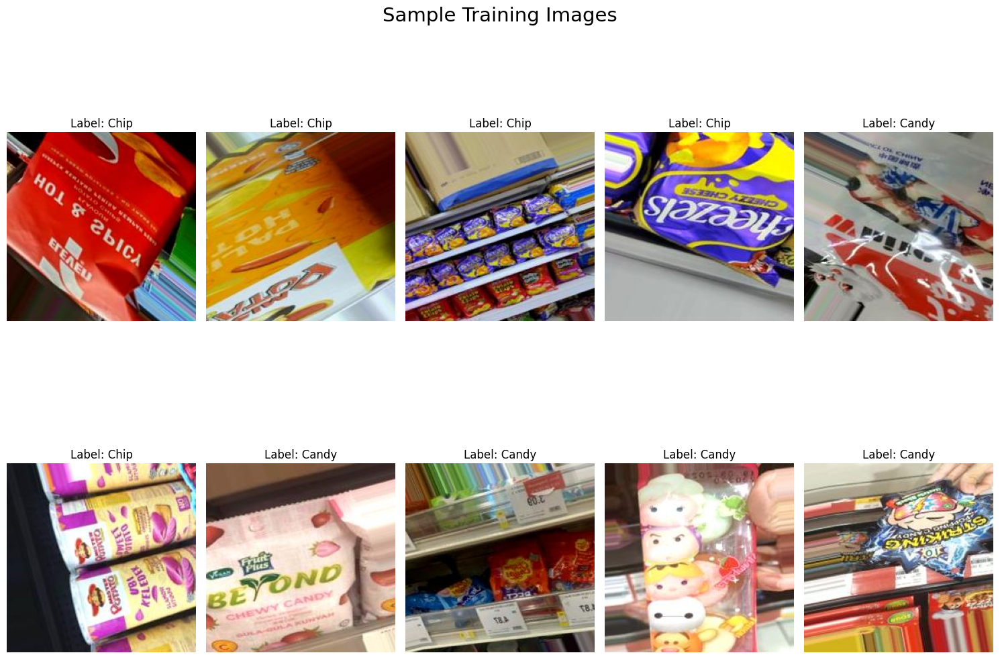

In [ ]:
# Print class indices to verify label mapping
print("Class indices:", train_batches.class_indices)

# Reverse the class_indices dictionary to get labels from indices
labels = {v: k for k, v in train_batches.class_indices.items()}

# Check the shape of a batch from the generator (debugging)
x_batch, y_batch = next(iter(train_batches))
print("Shape of input batch: ", x_batch.shape)
print("Shape of label batch: ", y_batch.shape)
print("Label batch (first 10): ", y_batch[:10])

# Visualize the first 10 images with their labels
fig, ax = plt.subplots(2, 5, figsize=(15, 12))
for i in range(10):
    ax[i//5, i%5].imshow(x_batch[i])
    ax[i//5, i%5].set_title(f"Label: {labels[int(y_batch[i])]}")
    ax[i//5, i%5].axis('off')

plt.tight_layout()
plt.suptitle("Sample Training Images", fontsize=21)
plt.show()


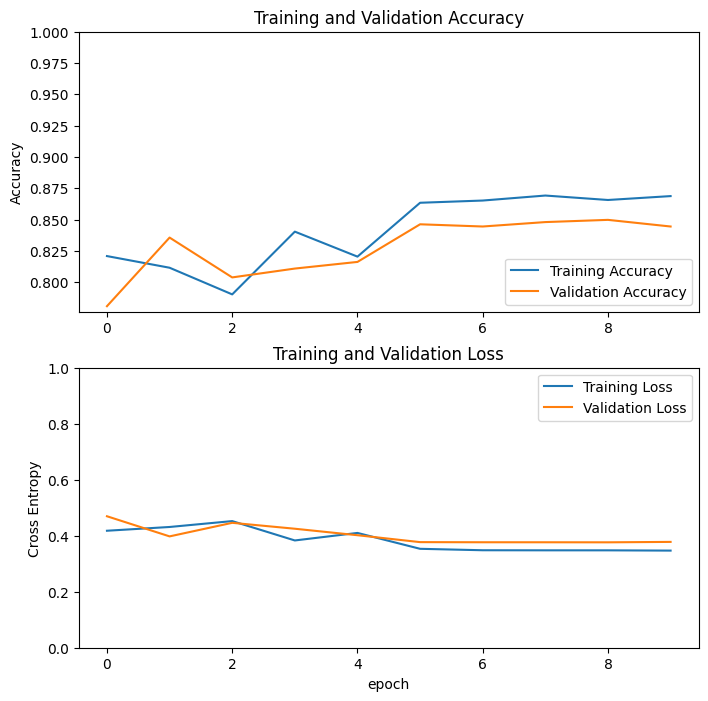

In [ ]:
#plot learning curve
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

61/61 [==============================] - 383s 6s/step - loss: 0.3856 - accuracy: 0.8306
Test accuracy: 0.8305785059928894


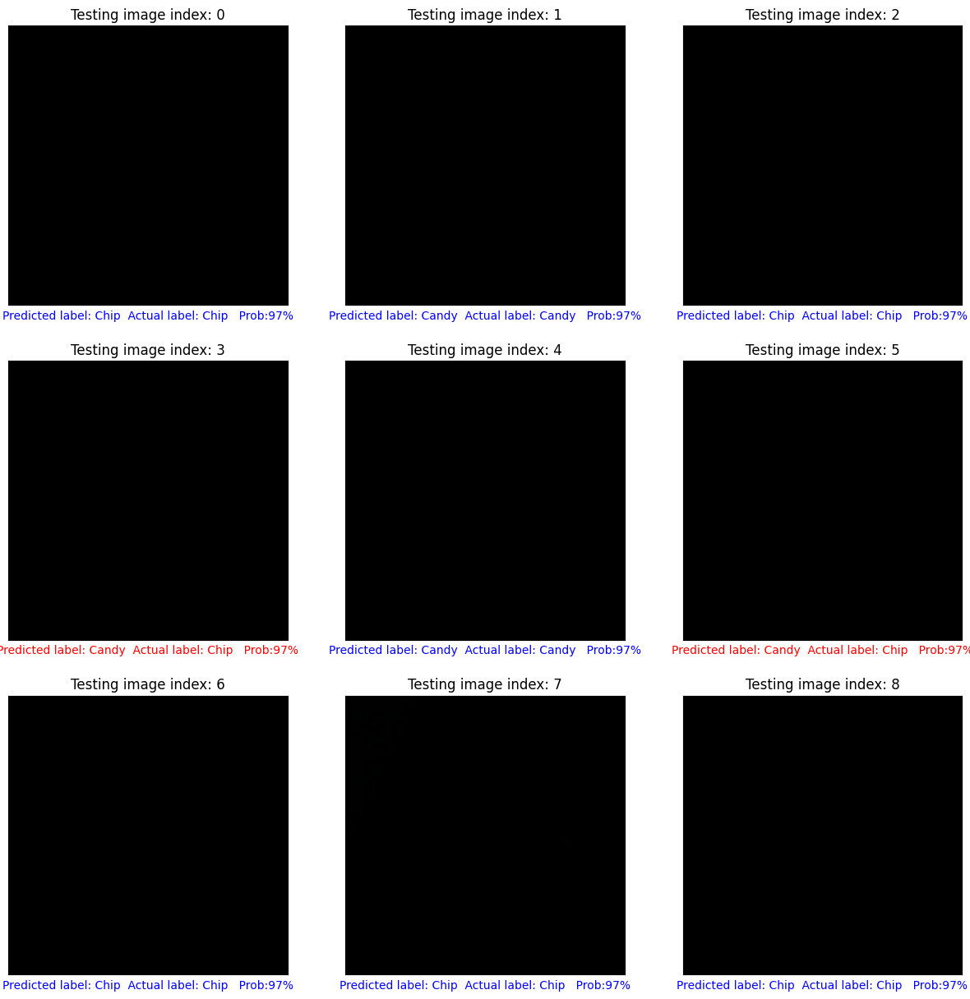

In [ ]:
#Test the developed model in several test images and visual the image, the predicted label, actual label and the probability (in %)
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

Found 1210 images belonging to 2 classes.
38/38 [==============================] - 19s 318ms/step


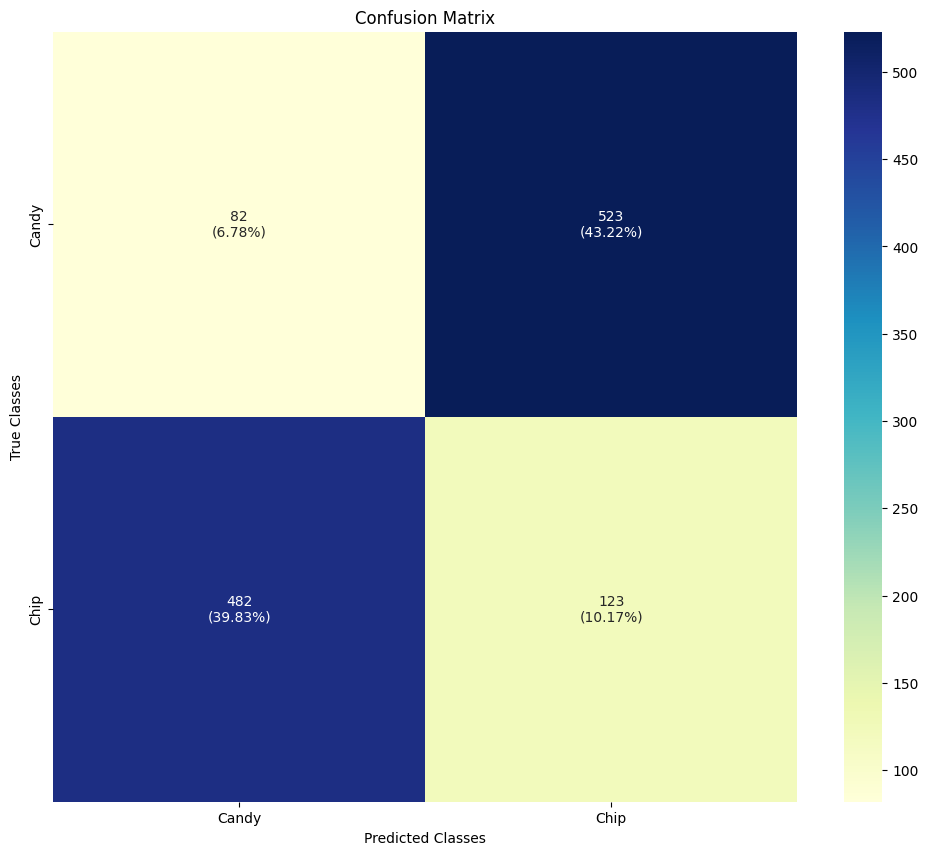

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the directory containing your test data
test_data_directory = '/content/drive/MyDrive/G9/output/test'

# Initialize an ImageDataGenerator for the test set
test_datagen = ImageDataGenerator(rescale=1./255)  # Rescale pixel values to [0, 1]

# Specify how you want to load your test data using the generator
test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(224, 224),  # Resize images to match the input size expected by your model
    batch_size=32,
    class_mode='categorical',  # Assumes you have categorical labels
    shuffle=False  # Do not shuffle the data, so predictions are in order
)

# Get predictions from the model
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)  # Predicted classes
y_true = test_generator.classes  # True classes

# Compute confusion matrix
cf_mtx = confusion_matrix(y_true, y_pred)

# Prepare labels for the confusion matrix
group_counts = ["{0:0.0f}".format(value) for value in cf_mtx.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_mtx.flatten() / np.sum(cf_mtx)]
box_labels = [f"{v1}\n({v2})" for v1, v2 in zip(group_counts, group_percentages)]
box_labels = np.asarray(box_labels).reshape(cf_mtx.shape[0], cf_mtx.shape[1])

# Plot the confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cf_mtx, annot=box_labels, fmt="", cmap="YlGnBu",
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.title('Confusion Matrix')
plt.show()


# c) **No image augmentation, only unfreeze the last and 2nd layer**

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxP

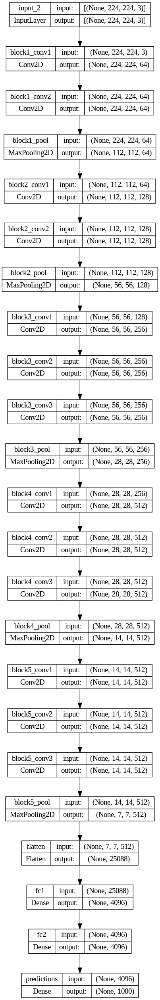

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer #unfreeze last layer only
model.add(tf.keras.layers.Dense(2))

#unfreeze 2 last layers
for layer in model.layers[-2:]:
    layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

In [ ]:
#compile model
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
#train model
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
9/9 [==============================] - 34s 4s/step - loss: 22.9653 - accuracy: 0.5347 - val_loss: 9.2708 - val_accuracy: 0.5047
Epoch 2/3
9/9 [==============================] - 29s 3s/step - loss: 2.4560 - accuracy: 0.7569 - val_loss: 2.1776 - val_accuracy: 0.6542
Epoch 3/3
9/9 [==============================] - 33s 4s/step - loss: 0.2975 - accuracy: 0.9144 - val_loss: 1.2798 - val_accuracy: 0.7103


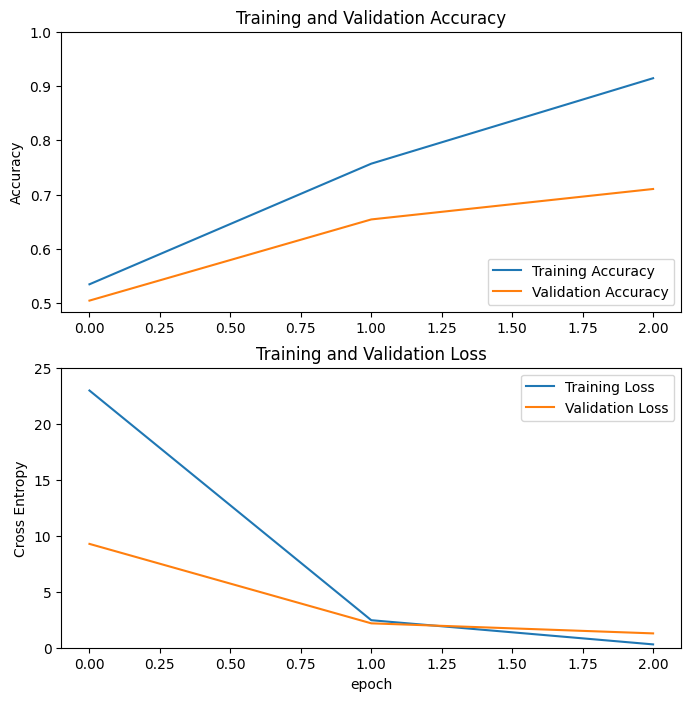

In [ ]:
#plot curves
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,25.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

5/5 [==============================] - 12s 2s/step - loss: 0.3279 - accuracy: 0.9091
Test accuracy: 0.9090909361839294


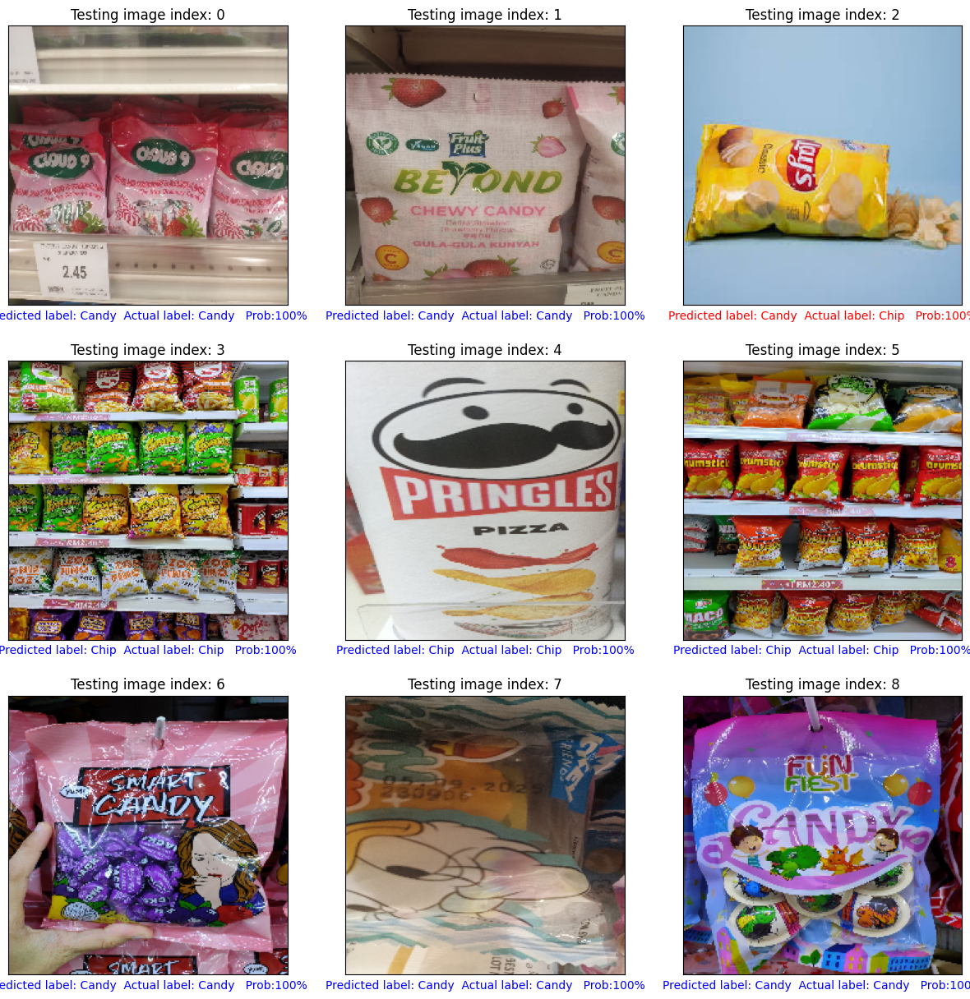

In [ ]:
# test the model
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

Found 432 images belonging to 2 classes.
(50, 224, 224, 3)
(50,)


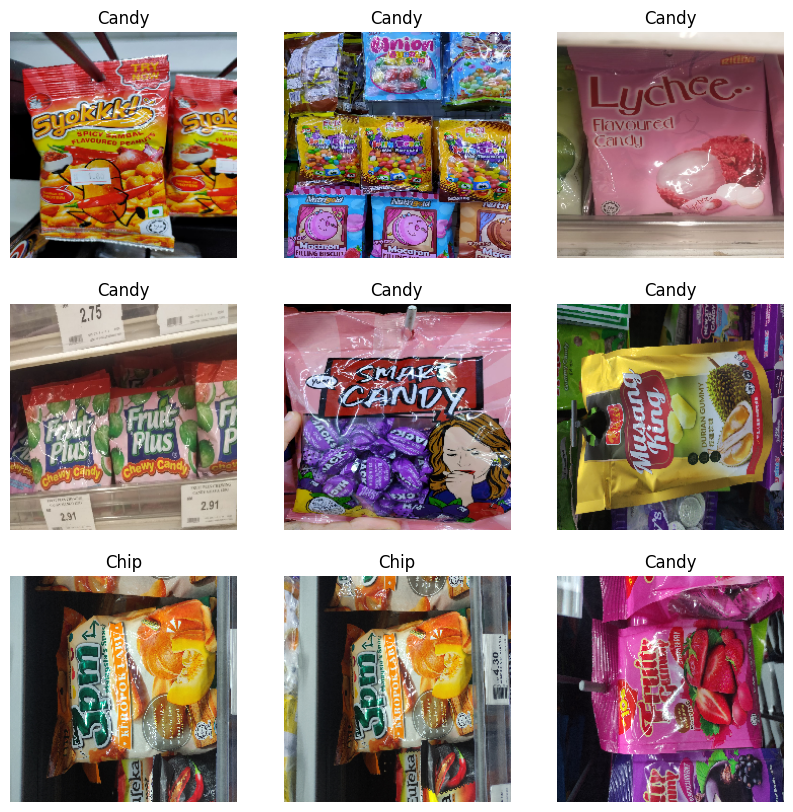

In [ ]:
# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

## Chapter 3: Discussion

You may discuss the comparison of result from each cases. What happen when you are varying the desired parameter

a) No augmentation, unfreeze last layer

Training and validation accuracy :

The accuracy has a mean value of about 0.60 at epochs and starts increasing almost monotonously, ending at around 0.90 at epochs. This regular increment would symbolize that the model is learning to fit the training dataset.

In contrast, the validation accuracy opens at around 0.75 and dips just a touch more to land at around 0.70 at the end of the second epoch. The fact that the validation accuracy is spiking down while the training accuracy is going up implies that the model might be overfitting. Overfitting is a case whereby one fine-tunes the model to the training data but the model now generalizes poorly to 'fuzzy' data.

Training and validation loss:

The training loss starts out at around 1.25 and drops very drastically close to 0.25 by the end of the second epoch. This suggests that the model is doing well on the training data due to the minimization of error.

The validation loss remains almost flat, beginning at about 0.75, and there is some increase towards the end. Near-constant validation loss, coupled with reducing validation accuracy, actually proceeds to further support the overfitting hypothesis. That is, as the complexity of models grows, they perform better on the training data but do not improve on the validation data.

Hence, the final training accuracy is 0.8554, while the training loss is equal to 0.3093. In general, this means that, although it performs fine regarding the training data, the quite low validation accuracy and its decreasing nature show that the performance on new data will most probably be weak. Hence, there is a need to act on overfitting to improve generalization.


b) Augmentation, freeze last layer

Training and validation accuracy:

The training accuracy starts at around 0.82 and oscillates during epochs generally upwards, upwards, and by the tenth epoch, it hits about 0.85. The validation accuracy starts around 0.80 and similarly fluctuates, holding around 0.83 toward completion. The fact that both the training and validation accuracies run quite close and similarly gives hope for good generalization performance without large hints of overfitting, because the mentioned metrics are quite close.

Training and validation loss:

The training and validation loss. It presents both losses, which start at around 0.45, changing over the epochs. The training and validation losses end up meandering around 0.4 after the tenth epoch; this is an indication that the model consists both on the validation data and the training data are equally good.

In this context, the final training accuracy of 0.8306 and training loss of 0.3856 are small indicators that the model is good enough for both the training and validation datasets. Convergence of the training and validation metrics thus establishes that this model does not suffer from the drawback of elevated variance or excessive bias.

Confusion matrix:

The confusion matrix will make a finer resolution into what a model found in classifying two classes: Candy and Chip. In the analysis, it is observed that out of 82 instances classified as Candy by the model, only 6.78% were actually Candy (True Positive for Candy). On the opposite side, 482 instances that turned out to be Chip were predicted to be Candy for a total of 39.83% of the total predictions (False Prediction for Candy). It identified 523 examples as belonging to the class Chip when they actually belonged to the Candy class. It is a False Negative with regard to the Chip class, which constitutes 43.22% of the total wrong predictions. It correctly predicted 123 examples as being Chip, which is 10.17% of all predictions and, therefore, the True Positive for Chip.

Indeed, the algorithm produces plenty of false positives and negatives, indicating difficulties in detecting class qualities that are really present, or in other words, differentiating between the two classes. The model tends to misclassify Candy as Chip and often misclassifies Chip as Candy. Such imbalances can occur due to numerous possible reasons, such as insufficient or imbalanced training data, overlapping features between the two classes, or the fact that the architecture of the model does not blend with the particular classification task very well.

c) No image augmentation, only unfreeze the last and 2nd layer

Training and validation accuracy:

The training accuracy seems to rise from around 0.5 to a little above 0.9 gradually over the 2 epochs. This might suggest the model has been learning well from the training data. The validation accuracy also rises from about 0.5 to about 0.7. Even though improved, it continues to do this at a much slower pace than seen with training accuracy.

Training and validation loss:

It starts at around 25, decreases rapidly to 0.5, and by the end of these 2 epochs. It means there is a rapid learning process in the reduction of the error in the training data. The validation loss starts at around 10 and decreases to about 0.3. Reduction in the validation loss indicates that the model also enhances its performance on the never-seen data, however, not as steeply as the training data.


The training accuracy is higher than the validation accuracy, which is typical. The final accuracy of 0.9091 is quite good, indicating the model performs well on the training data. Both training and validation losses decrease significantly, which is a good sign of the model learning effectively. The final loss of 0.3279 suggests that the model’s predictions are reasonably close to the actual values.

## Chapter 4: Conclusion

This project aims to develop an automated grocery detection system using a Convolutional Neural Network (CNN) with a transfer learning approach, specifically focusing on classifying images into two categories: chips and candy. The dataset was created by collecting images of each category from various angles and distances, including both far mode and near mode shots. This dataset was then divided into 70% training data and 30% testing data, with 20% of the training data further allocated for validation to fine-tune the model and prevent overfitting. The automated grocery detection system was developed using the VGG16 model. The testing accuracy was evaluated based on three different setups: first, (a) with no image augmentation and only unfreezing the last layer; second, (b) with image augmentation and only the unfreezing last layer; and third, (c) with no image augmentation and only unfreezing the last and second last layers.

From the result obtained from this project, the setup (a) showed strong performance on the training data but suffered from overfitting which led to a poor generalization on validation data. By comparing the result between the setup (a) and setup (b), setup (b) demonstrated the best balance between training and validation performance. This implied an effective generalization and minimal overfitting, making it the most promising for accurate grocery image classification. From this result,  it can be stated that image augmentation can help improve generalization and reduce overfitting, as evidenced by its balanced training and validation performance as shown in the project. This is because data augmentation involves transformation such as random cropping, rotation, scaling, and flipping which increase the dataset size and therefore, provides the model with more diverse examples to learn from, then, increases the generalization of data (Poojary et al., 2021). Lastly, setup (c) achieved the highest training accuracy among all setups, suggesting it learns the training data better. However, it showed signs of overfitting but compared with setup (a), setup (c) demonstrates better improvement on validation data despite overfitting.

Overall, the automated grocery detection system was developed by using the VGG16 model. The setup (b) showed the most promise in achieving successful grocery classification as it shown a minimal overfitting and increase generalization. Furthermore,  this project shows how different setups (e.g., unfreezing layers, using data augmentation) impact the accuracy and efficiency of CNN-based models. And this sets a benchmark for future image classification projects, providing a reference point for expected performance metrics. Additionally, finding the right balance between model complexity and regularization is crucial to achieve good performance on both the training and validation data. This requires careful experimentation and monitoring of the training and validation metrics to strike the optimal balance and avoid overfitting.


## References
1) Tammina, S. (2019). Transfer learning using VGG-16 with Deep Convolutional Neural Network for Classifying Images. International Journal of Scientific and Research Publications, 9(10), p9420. https://doi.org/10.29322/ijsrp.9.10.2019.p9420

2) Poojary, R., Raina, R., & Kumar Mondal, A. (2021). Effect of data-augmentation on fine-tuned CNN model performance. IAES International Journal of Artificial Intelligence (IJ-AI), 10(1), 84. https://doi.org/10.11591/ijai.v10.i1.pp84-92